**As a presidential enthusiast, I analyzed each State of the Union speech given by U.S. presidents during my lifetime (Since Ronald Reagan in 1981 to Donald Trump in 2020).  After doing some cleaning and digging, I was surprised to see what the data revealed. Just from Topic Modeling, I was able to conclude that republicans like to focus on foreign issues (Soviet Union and Iraq) whereas democrats like to talk about domestic issues (kids, wages, race).  Did you know that for the most parts, presidents who have served 2 terms, the SoTU speech in the second term tend to be more positive than the inaugural speech when they are initially elected president.** 

1. If you split the last 40 annual State of the Union speeches into 2 clusters, do you think it would split along partisan lines (republicans / democrats)? I did – but I was wrong. The clusters were delineated along a different point as indicated in cell 46.

2. Would you be able to describe the underlying theme of each presidency (since Ronald Reagan) in one word? – I tried doing that using Term Frequency Inverse Document Frequency (TF-IDF) in cell 56.

3. Just exactly how was Donald Trump’s State of the Union speeches different than all others? I answered that in cell 30.

4. Who do you think gives longer speeches – republicans/democrats? - I answered that in cell 33.

These are only few of the questions I tried to answer in my analysis below. To dig further into analyzing each president, join me in my journey to scrutinize and study the SoTU speeches below:


**A. IMPORT LIBRARIES**                                                                                        
**B. DATA COLLECTION (webscraping)**                  
**C. DATA CLEANUP (and Pandas Dataframe)**                                                                      
**D. DATA EXPLORATION**                                                                                     
    D1.  Unique Words and Stopwords                                                                                       
    D2a. Word Cloud (Most Common Word per President)                                                             
    D2b. Context in Which the Most Common Word was used by Each President (using Spacy)                                        
    D3a. Sentiment Analysis of Adjectives Used (using Spacy)                                                                  
    D3b. Usage of the Frequently Used Adjectives per President                                                         
    D3c. Usage of the Adjective "Amercian"                                                                                  
    D4.  Length of Speeches                                                                                        
**E. TOPIC MODELING**                                                                                                
**F. CLUSTER ANALYSIS**                                                                                              
    F1. Vectorization                                                                         
    F2. KMeans Clusters                                                                                   
    F3. Plotting the Clusters                                                                                     
    F4. Cluster Analysis (Pre/Post 911)                                                                            
    F5. Republican / Democrats Analysis                                                                     
    F6. Presidential Theme From Reagan to Trump                                                                     

### A. Importing Libraries ###

In [1]:
import spacy
nlp = spacy.load('en_core_web_sm')  #loads the vocabulary
from spacy.matcher import Matcher
from spacy.matcher import PhraseMatcher


import requests
from bs4 import BeautifulSoup


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim import matutils, models
from textblob import TextBlob
import scipy.sparse


import numpy as np
from collections import Counter


import pandas as pd
pd.set_option('display.max_columns',20000)
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.html.use_mathjax', False) #makes literal read of certain characters scraped in (like $)

### B. Data Collection###

In [2]:
#reading in and parsing html

website=r'https://www.presidency.ucsb.edu/documents/presidential-documents-archive-guidebook/annual-messages-congress-the-state-the-union'

r=requests.get(website)
soup=BeautifulSoup(r.text,'lxml')

In [3]:
#retrieving the links for the transcript of each State_of_The_Union speech over the last 40 years

links=[]
for tag in soup.find_all('a'):
    url=tag.get('href')
    if url !=None and url.startswith('https:') and ("ws" in url or "session" in url):
        links.append(url) 

#links

In [4]:
#reading in the SoTU transcripts

SOTU_transcripts=[]
for link in links[0:40]:
    r=requests.get(link)
    soup=BeautifulSoup(r.text, 'lxml')
    transcripts=[]
    SOTU_transcripts.append(transcripts)
    for tag in soup.findAll('div',class_='field-docs-content'):
        for p_tag in tag.findAll('p'):             
            transcripts.append(p_tag.text)
            

#SOTU_transcripts

### TO BE DELTED____________________________________________________________________________________________
#remove $ sign in front of numbers as this results in italicized and bolded text when converted into a dataframe

# SOTU_transcripts_=[]
# for transcript in SOTU_transcripts:
#     cleaned=[]
#     SOTU_transcripts_.append(cleaned)
#     for verbiage in transcript:
#         removed_sign=verbiage.replace('$','')
#         cleaned.append(removed_sign)
        
#SOTU_transcripts_        

In [5]:
#list of presidents over the last 40 years

presidents=[]
for link in links[0:40]:
    r=requests.get(link)
    soup=BeautifulSoup(r.text, 'lxml')
    for tag in soup.findAll('div',class_='field-docs-person'):
        presidents.append(tag.a.text)
            
#presidents

In [6]:
#list of dates over the last 40 years

dates=[]
for link in links[0:40]:
    r=requests.get(link)
    soup=BeautifulSoup(r.text, 'lxml')
    for tag in soup.findAll('div',class_='field-docs-start-date-time'):
        dates.append(tag.span.contents[0])
            
#dates

In [7]:
#length of all speeches in minutes

r=requests.get(r'https://www.presidency.ucsb.edu/documents/presidential-documents-archive-guidebook/annual-messages-congress-the-state-the-union-0')
soup=BeautifulSoup(r.text,'lxml')

length=[]
for tag in soup.findAll('tbody'):
    for tag_td in tag.findAll('td'):
        text=tag_td.text
        if ":" in text or "apx" in text or text=='not measured':
            length.append(text)

#from Reagon on
length=length[21:]  

#removing average speech for the duration (term/2 terms) of each presidency since Reagon
To_be_removed=['apx. 0:45:00','1:14:51','0:52:35','1:02:45','--:--',]    

length_=[time for time in length if time not in To_be_removed]


length_of_speech=[]
for time in length_:
    if time == 'not measured':
        time='0:40:00'  
        length_of_speech.append(time)
    elif 'apx.' not in time:
        length_of_speech.append(time)
    else:
        hr=time.replace('apx. ','0:')
        sec=hr.replace(' min',':00')
        pd=sec.replace('.','')
        length_of_speech.append(pd)
        
        
#length_of_speech.reverse
        
#aligning time stamps with the same order as the dataframe        
rev4=np.arange(0,len(length_of_speech),4)

Length_of_Speech=[]
for index in rev4:
    rev=list(reversed(length_of_speech[index:index+4]))
    for ind in rev:
        Length_of_Speech.append(ind)
        
Length_of_Speech.reverse()  

### C. Data Cleanup ###        

**DataFrame**

In [8]:
#creating a dataframe

import pandas as pd
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.html.use_mathjax', False) #makes literal read of certain characters scraped in (like $)


#new dataframe
df=pd.DataFrame({'Presidents':presidents,'Date':dates,'Raw_SOTU_Transcripts':SOTU_transcripts})


#converting Date to datetime and extracting year and dropping the Date column
df['Year']=pd.to_datetime(df['Date']).dt.to_period('Y')
df.drop('Date',axis=1,inplace=True)


#new column - length of speech
df['Length_of_Speech']=Length_of_Speech


#new column - republican / democrat
df["Party_affiliation"]=np.where((df["Presidents"]=='Donald J. Trump') | (df["Presidents"]=='George W. Bush') | (df["Presidents"]=='George Bush') | (df["Presidents"]=='Ronald Reagan'),'Republican','Democrat')


#sorting the dataframe by year
df=df.sort_values('Year',ascending=False)


#df.head()

In [9]:
# Setting df index to be President's initials and year of the speech

Conditions=[df['Presidents']=='Barack Obama',
            df['Presidents']=='Donald J. Trump',
            df['Presidents']== 'George Bush', 
            df['Presidents']=='George W. Bush', 
            df['Presidents']=='Ronald Reagan', 
            df['Presidents']=='William J. Clinton']

Result=['BO-'+df['Year'].dt.strftime('%Y'),
        'DJT-'+df['Year'].dt.strftime('%Y'),
        'GHB44-'+df['Year'].dt.strftime('%Y'),
        'GWB41-'+df['Year'].dt.strftime('%Y'),
        'RR-'+df['Year'].dt.strftime('%Y'),
        'BC-'+df['Year'].dt.strftime('%Y')]

df['Init_Year']=np.select(Conditions,Result)



#set index to Presidential initials and Year
df=df.set_index('Init_Year',drop=True)


#df.head()

In [10]:
# DF changes

#reshifting the new column
new_column=df.pop('Party_affiliation')
df.insert(1,'Party_Affiliation',new_column)


#converting list to string
df['Raw_SOTU_Transcripts']=df['Raw_SOTU_Transcripts'].apply(lambda x:' '.join(x))

#df.head()

In [11]:
# general cleanup

#making all characters lowercase
df['Raw_SOTU_Transcripts']=df['Raw_SOTU_Transcripts'].str.lower()

#replacing audience chants
df['Raw_SOTU_Transcripts']=df['Raw_SOTU_Transcripts'].str.replace('(audience:\s|audience members.)[usaboo—.!\s]{2,}','')

#replacing contractions
df['Cleaned']=df['Raw_SOTU_Transcripts'].str.replace("\'s"," s").str.replace("n\'t"," not").str.replace("\'ve"," have").str.replace("\'re"," are").str.replace("\'ll"," will").str.replace("\'m"," am").str.replace("\n","").str.replace("\'d",' would')

#replacing punctuations
df['Cleaned']=df['Cleaned'].str.replace('[!"#$%&—\'*+,-./:;<=>?@\\^_`{|}~]','')

#replacing anything between brackets or paranthesis
df['Cleaned']=df['Cleaned'].str.replace('\[\w*\]','').str.replace('\(\w*\)','')

df['Cleaned']=df['Cleaned'].str.replace('\w*\d\w*',' ')

df.head()

,Presidents,Party_Affiliation,Raw_SOTU_Transcripts,Year,Length_of_Speech,Cleaned
Init_Year,,,,,,
DJT-2020,Donald J. Trump,Republican,"the president. thank you very much. thank you. thank you very much. madam speaker, mr. vice pres...",2020,1:18:04,the president thank you very much thank you thank you very much madam speaker mr vice president ...
DJT-2019,Donald J. Trump,Republican,"madam speaker, mr. vice president, members of congress, the first lady of the united states — (a...",2019,1:22:25,madam speaker mr vice president members of congress the first lady of the united states and m...
DJT-2018,Donald J. Trump,Republican,"the president. mr. speaker, mr. vice president, members of congress, the first lady of the unite...",2018,1:20:32,the president mr speaker mr vice president members of congress the first lady of the united stat...
DJT-2017,Donald J. Trump,Republican,"thank you very much. mr. speaker, mr. vice president, members of congress, the first lady of the...",2017,1:00:10,thank you very much mr speaker mr vice president members of congress the first lady of the unite...
BO-2016,Barack Obama,Democrat,"thank you. mr. speaker, mr. vice president, members of congress, my fellow americans: tonight ma...",2016,0:58:44,thank you mr speaker mr vice president members of congress my fellow americans tonight marks the...


### D. Data Explorations ###

**D1. FREQUENCY OF UNIQUE WORDS AND STOPWORDS**

In [12]:
#wordcount PER PRESIDENTIAL SPEECH
#dictionary of words PER PRESIDENTIAL SPEECH

Bag_of_words=[]
wordcount={}
for pres,transcript in zip(df.index,df["Cleaned"]):
    wordcount[pres]=Counter(transcript.split(' ')).most_common()
    for word,count in wordcount[pres]:
        if word !='':
            Bag_of_words.append(word)
    
#wordcount.items()

In [13]:
print(f'There are {len(Bag_of_words)} dictionary words - comprised of UNIQUE WORDS PER SPEECH (stored in \'wordcount\' dictionary).\nIn other words, if the same word appeared in another speech, then that same word would appear again in the dictionary.\n\nTHE FIRST FIFTY OF THESE WORDS ARE:\n\n {Bag_of_words[:49]}')

There are 59342 dictionary words - comprised of UNIQUE WORDS PER SPEECH (stored in 'wordcount' dictionary).
In other words, if the same word appeared in another speech, then that same word would appear again in the dictionary.

THE FIRST FIFTY OF THESE WORDS ARE:

 ['the', 'and', 'to', 'of', 'in', 'we', 'is', 'our', 'a', 'that', 'you', 'are', 'for', 's', 'i', 'have', 'on', 'with', 'america', 'this', 'american', 'very', 'will', 'thank', 'all', 'was', 'has', 'my', 'as', 'be', 'at', 'than', 'his', 'he', 'country', 'not', 'new', 'also', 'it', 'people', 'americans', 'first', 'by', 'one', 'more', 'administration', 'now', 'years', 'tonight']


In [14]:
# number of speeches the word was uttered in 
# note: since the speeches go back 40 years, the most any word can appear below is 40 times)
words_speeches=Counter(Bag_of_words).most_common()  

#if that word was uttered in more than half the speeches(20) or only in a couple of speeches, add that to stopwords
stopwords_additions=[word for word,count in words_speeches if count>=(len(df.index))/2 or count<=2]


stopwords_manually_added=['alice','rebekah','ellie','tony',
'cj','megan','cory','ryan','richard','dean',
'id','','ought','thats','thank','let','audience','lets','know',
'want','thing','way','need','help','like','president','President','great',
'united','states','decades','everybody','final','sergeant',
'gallery','incredible','beautiful']


for each_word in stopwords_manually_added:
    stopwords_additions.append(each_word)
    

#adding stopword in stopwords_additions to nlp stopwords           
for each_word in stopwords_additions:
    nlp.Defaults.stop_words.add(each_word)
    nlp.vocab[each_word].is_stop=True 



#print(f'There are {len(nlp.Defaults.stop_words)} words.')
#print("*"*50)
#print(f'stopwords are {nlp.Defaults.stop_words}')

print(f"These are words in the \'Bag_of_words\' list and the number of annual SoTU speech that word was uttered in.\nSince we are analyzing the past 40 speeches-since 1981-the most number of times any word can appear in is 40.\n\nSOME OF THESE WORDS ARE:\n(WORD , NUMBER OF SPEECHES THE WORD APPEARED IN): \n\n {words_speeches[0:(len(words_speeches)):250]}")

These are words in the 'Bag_of_words' list and the number of annual SoTU speech that word was uttered in.
Since we are analyzing the past 40 speeches-since 1981-the most number of times any word can appear in is 40.

SOME OF THESE WORDS ARE:
(WORD , NUMBER OF SPEECHES THE WORD APPEARED IN): 

 [('the', 40), ('find', 35), ('return', 27), ('spent', 21), ('passing', 17), ('renewed', 13), ('communism', 11), ('winning', 9), ('marketplace', 8), ('prevents', 7), ('conclusion', 6), ('confirmed', 5), ('panama', 5), ('fragile', 4), ('contain', 4), ('backing', 3), ('shorter', 3), ('strongholds', 3), ('benjamin', 3), ('resistance', 2), ('beijing', 2), ('lender', 2), ('tape', 2), ('formally', 2), ('cares', 2), ('unbridled', 1), ('travesty', 1), ('milestones', 1), ('grinds', 1), ('readytowork', 1), ('saddled', 1), ('crashed', 1), ('reprogram', 1), ('immense', 1), ('rations', 1), ('dieso', 1), ('corporation', 1), ('significance', 1), ('permeates', 1), ('coup', 1), ('[south', 1), ('mutually', 1), ('du

In [15]:
print(f'With respect to the Spacy default stopwords, we added any word from the container \'words_speeches\' that appeard in more than half(20) of the speeches or less than or equal to 2 speeches. Moreover, we also added proper names and/or any word that does not add value to the corpus. SOME of the stopword additions are (please note Spacy default stop_words are not displayed below):\n\n SOME OF THE STOPWORDS BASED ON INDICATED CRITERIA: \n\n {stopwords_additions[0:len(stopwords_additions):50]}') 

With respect to the Spacy default stopwords, we added any word from the container 'words_speeches' that appeard in more than half(20) of the speeches or less than or equal to 2 speeches. Moreover, we also added proper names and/or any word that does not add value to the corpus. SOME of the stopword additions are (please note Spacy default stop_words are not displayed below):

 SOME OF THE STOPWORDS BASED ON INDICATED CRITERIA: 

 ['the', 'every', 'strong', 'much', 'again', 'find', 'young', 'secure', 'everything', 'major', 'return', 'anyone', 'nothing', 'large', 'relief', 'spent', 'having', 'jobkilling', 'weighing', 'alice', 'dominican', 'racing', 'flaws', 'abandonment', 'startups', 'fearful', 'pregnancies', 'mali', 'rail', 'title', 'thick', 'pretending', 'concept', 'hybrids', 'grim', 'rage', 'pessimists', 'midnight', 'manmade', 'brotherhood', 'specifically', 'integrated', 'mccainfeingold', 'impression', 'hollow', 'passive', 'frankness', 'fault', 'spite', 'mentality', 'achieves', 'preac

In [16]:
print("*"*125)

*****************************************************************************************************************************


**D2a. WORD CLOUD**
- Most frequent used displayed in word cloud
- The context in which the word was uttered in each speech

In [17]:
from wordcloud import WordCloud

wc_ = WordCloud(stopwords=nlp.Defaults.stop_words, background_color="white", colormap="Dark2", max_font_size=150, random_state=42)  #setting up the image

In [18]:
import matplotlib.pyplot as plt


plt.figure(figsize=(192,256))

for index, president in enumerate(df.index):
    wc_.generate(df['Cleaned'][president])   # generate the image
    
    plt.subplot(10, 4, index+1)                    # It is 3x4 frame and with each loop, plot in subplot sequentially (has to be be first)
    
    plt.imshow(wc_, cmap='twilight')               # display the image
     
    plt.title(df.index[index],fontsize=100)                  # adding title to each subplot 
    
    plt.axis("off")                               # axis dont mean anything so turn the axis off
            
print('\n\nAfter removing stopwords from the transcript, these are the most frequently used words per SoTU speech for the last 40 years:\n\nTakeaways:\n\n1.Other than Obama\'s second term, the most frequently used word *does* reflect the overall message of the time.')    
plt.show()



After removing stopwords from the transcript, these are the most frequently used words per SoTU speech for the last 40 years:

Takeaways:

1.Other than Obama's second term, the most frequently used word *does* reflect the overall message of the time.


**D2b. GIVEN THE MOST FREQUENT USED WORDS ABOVE, IN WHAT CONTEXT WERE THESE WORDS USED?**  
- To answer that, please refer to the dataframe below.

In [19]:
#transcript per speech cleaned and without stopwords
Cleaned_wo_sw=[]
for transcript in df['Cleaned']:
    temp=[]
    Cleaned_wo_sw.append(temp) 
    transcript=transcript.split(" ")
    for verbiage in transcript:
        if verbiage not in nlp.Defaults.stop_words and verbiage not in [str(x) for x in range(1000)]:
            temp.append(''.join(verbiage))

#Frequency of uttered words per speech            
Uttered_words=[Counter(transcript).most_common() for transcript in Cleaned_wo_sw] 

#Most_uttered word per speech 
Most_uttered_word={pres:transcript[0][0] for transcript,pres in zip(Uttered_words,df.index)}

print(f'This is the most uttered word per speech for each of the last 40 years:\n\n{Most_uttered_word}')

This is the most uttered word per speech for each of the last 40 years:

{'DJT-2020': 'criminal', 'DJT-2019': 'border', 'DJT-2018': 'immigration', 'DJT-2017': 'immigration', 'BO-2016': 'voices', 'BO-2015': 'paid', 'BO-2014': 'iran', 'BO-2013': 'wage', 'BO-2012': 'oil', 'BO-2011': 'race', 'BO-2010': 'banks', 'BO-2009': 'banks', 'GWB41-2008': 'iraqi', 'GWB41-2007': 'enemy', 'GWB41-2006': 'hopeful', 'GWB41-2005': 'terror', 'GWB41-2004': 'marriage', 'GWB41-2003': 'saddam', 'GWB41-2002': 'terror', 'GWB41-2001': 'reading', 'BC-2000': 'gun', 'BC-1999': 'surplus', 'BC-1998': 'actually', 'BC-1997': 'prepare', 'BC-1996': 'smaller', 'BC-1995': 'cold', 'BC-1994': 'produced', 'BC-1993': 'recommend', 'GHB44-1992': 'missiles', 'GHB44-1991': 'struggle', 'GHB44-1990': 'kids', 'GHB44-1989': 'moral', 'RR-1988': 'revolution', 'RR-1987': 'soviet', 'RR-1986': 'win', 'RR-1985': 'revolution', 'RR-1984': 'commission', 'RR-1983': 'commission', 'RR-1982': 'needy', 'RR-1981': 'reducing'}


In [20]:
#making a doc object out of each speech    
Doc={pres:nlp(''.join(each_transcript)) for each_transcript,pres in zip(df['Raw_SOTU_Transcripts'],df.index)}
print('Putting each transcript into a Spacy doc object and in a key:value dictionary')

Putting each transcript into a Spacy doc object and in a key:value dictionary


In [21]:
#putting most uttered word per speech into context via Spacy's Phrase_matcher

from spacy.matcher import PhraseMatcher
Phrase_matcher = PhraseMatcher(nlp.vocab)

context=[]
for word,pres in zip(Most_uttered_word.values(),df.index):
    text=word.split(" ")                       #putting each most uttered word per speech in a list
    verbiage=[nlp(word) for word in text]      #passing that word to a Spacy doc object
    Phrase_matcher.add(pres, None, *verbiage)  #labeling the phrase_matcher
    doc=Doc[pres]                              #Each transcript       
    Phrase_matches=Phrase_matcher(doc)         #passing each transcript into a phrase_matcher
    temp=[]
    context.append(temp)
    for number,beg,end in Phrase_matches:      
        temp.append(doc[beg-10:end+10].text)   #slicing 10 words before and after the most uttered word per transcript    
    Phrase_matcher.remove(pres)                #removing the label

#-----------------------------------------------------------------------
pd.set_option('display.max_colwidth',200)
pd.set_option('display.max_rows',40)

#creating a dataframe of the most uttered word per speech put into context
Context_df=pd.DataFrame(context,index=[(k+' '+v) for k,v in Most_uttered_word.items()],columns=['Context_'+str(x+1) for x in np.arange(19)] )

print('\n\nContext in which the most fequent word was uttered in each speech. \n\nIndex is labeled by pres/year/most_uttered_word. Column is labeled by context\n')
Context_df.head()



Context in which the most fequent word was uttered in each speech. 

Index is labeled by pres/year/most_uttered_word. Column is labeled by context



,Context_1,Context_2,Context_3,Context_4,Context_5,Context_6,Context_7,Context_8,Context_9,Context_10,Context_11,Context_12,Context_13,Context_14,Context_15,Context_16,Context_17,Context_18,Context_19
DJT-2020 criminal,chance at life is made possible because we passed landmark criminal justice reform into law. everybody said that criminal justice,"landmark criminal justice reform into law. everybody said that criminal justice reform couldn't be done, but i got","year, our brave ice officers arrested more than 120,000 criminal aliens charged with nearly 10,000 burglaries, 5,000 sexual assaults","where radical politicians have chosen to provide sanctuary for these criminal illegal aliens. the president. in sanctuary cities,","sanctuary cities, local officials order police to release dangerous criminal aliens to prey upon the public, instead of handing","be safely removed. just 29 days ago, a criminal alien freed by the sanctuary city of new york was",law declaring their whole state to be a sanctuary for criminal illegal immigrants—a very terrible sanctuary—with catastrophic,", local authorities released him. days later, the criminal alien went on a gruesome spree of deadly violence.",". rocky was at a gas station when this vile criminal fired eight bullets at him from close range, murdering","be a sanctuary for law-abiding americans, not criminal aliens. in the last 3 years, ice has",None,None,None,None,None,None,None,None,None
DJT-2019 border,"protect our homeland, and secure our very dangerous southern border. now is the time for congress to show the","up to our country in areas where there is little border protection. i have ordered another 3,750 troops to our",". i have ordered another 3,750 troops to our southern border to prepare for this tremendous onslaught. this is a","a moral issue. the lawless state of our southern border is a threat to the safety, security, and",i am asking you to defend our very dangerous southern border out of love and devotion to our fellow citizens and,"innocent americans are killed by lethal drugs that cross our border and flood into our cities, including meth, heroin","states, and they almost all come through our southern border. just yesterday, an ms-13 gang member was taken","members by the thousands. but until we secure our border, they're going to keep streaming right back in","lost because our nation failed to control its very dangerous border. in the last two years, our brave ice","a commonsense proposal to end the crisis on the southern border. it includes humanitarian assistance, more law enforcement,",it will be deployed in the areas identified by the border agents as having the greatest need. and these agents,".) san diego used to have the most illegal border crossings in our country. in response, a strong","this powerful barrier almost completely ended illegal crossings. the border city of el paso, texas used to have extremely",None,None,None,None,None,None
DJT-2018 immigration,", especially immigrant communities, will also be helped by immigration policies that focus on the best interests of american workers",. we have proposed new legislation that will fix our immigration laws and support our ice and border patrol agents—,", the house and senate will be voting on an immigration reform package. in recent months, my administration has","both democrats and republicans to craft a bipartisan approach to immigration reform. based on these discussions, we presented congress","'s time to begin moving toward a merit-based immigration system, one that admits people who are skilled,",longer afford. it's time to reform these outdated immigration rules and finally bring our immigration system into the 21st,to reform these outdated immigration rules and finally bring our immigration system into the 21st century. these four pillars represent,"that will create a safe, modern, and lawful immigration system. for over 30 years, washington has tried",None,None,None,None,None,None,None,None,None,None,N

In [22]:
print("*"*125)

*****************************************************************************************************************************


**D3a. SENTIMENT ANALYSIS**
- sentiment analysis of adjectives used in the speeches

In [23]:
#a function to search for rule_based matching

from spacy.matcher import Matcher
matcher = Matcher(nlp.vocab)

def tokens(key,value):
    filtered_list=[]
    for pres in Doc.keys():
        pattern=[{key:value}]                #what we are searching for
        matcher.add(pres, None, pattern)     #labeling the rule_based_matcher
        found_matches = matcher(Doc[pres])   #passing each transcript into the matcher
        temp=[]
        filtered_list.append(temp)
        for number, beg, ending in found_matches:
            verbiage=Doc[pres][beg]         #slicing the transcript for the match
            temp.append(verbiage.text)
        matcher.remove(pres)                #removing the label
    return filtered_list

In [24]:
#Obtaining an index of all the adjectives used in each of the speeches.
adjectives=tokens('POS','ADJ')

adj={}
for adjective,pres in zip(adjectives,df.index):
    adj[pres]=adjective

print(f"Below is a multi-dimensional list of all the adjectives used.\n\nThese are the adjectives used per speech:\n {adj}")

Below is a multi-dimensional list of all the adjectives used.

These are the adjectives used per speech:
 {'DJT-2020': ['first', 'fellow', 'great', 'american', 'incredible', 'respected', 'bright', 'economic', 'other', 'long', 'broken', 'jobless', 'tired', 'constant', 'american', 'short', 'american', 'unimaginable', 'short', 'thrilled', 'best', 'unmatched', 'close', 'secure', 'great', 'stronger', 'prosperous', 'inclusive', 'unparalleled', 'extraordinary', 'historic', 'fair', 'reciprocal', 'pro', 'worker', 'pro', '-', 'family', 'pro', '-', 'growth', 'most', 'pro', '-', 'american', 'unbridled', 'high', 'new', 'more', 'previous', 'lowest', 'average', 'lower', 'true', 'economic', 'previous', 'great', 'economic', 'hispanic', 'lowest', 'african', 'low', 'african', 'american', 'lowest', 'lowest', 'last', 'new', 'disabled', 'low', 'high', 'lowest', 'young', 'last', 'more', 'last', 'working', 'net', 'bottom', 'top', 'flat', 'low', 'blue', 'real', 'median', 'highest', 'more', 'possible', 'amazing

In [25]:
#sentiment analysis of adjectives used by each president in their respective SoTU speech

subjectivity=[]
polarity=[]
for transcript in adjectives:
    polarity.append(TextBlob(' '.join(transcript)).sentiment.polarity)
    subjectivity.append(TextBlob(' '.join(transcript)).sentiment.subjectivity)
    
#polarity 
#subjectivity

Takeaways: 

1. The SoTU speech given by George W. Bush given after 9/11 (in Jan 2002) reflected the most positive sentiment and hope. 

2. The SoTU reflecting the most negative sentiment was delivered by Barach Obama during the fiscal crisis in 2009, 2010.

3. Another interesting takeaway is that for each president who served 2 terms other than George W. Bush (2001, 2005) - (RR(1981,1985),BC(1993,1997),BO(2009,2013)) - the SoTU speech given in the beginning of the second term was noticably more positive than the inauguration speech in the first term.


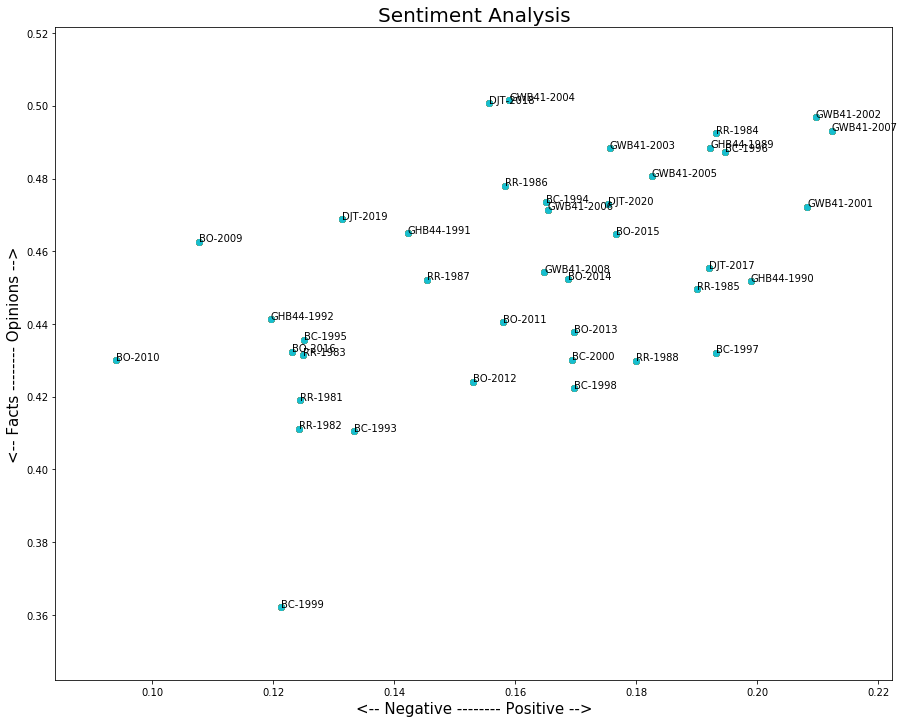

In [26]:
#scatter plot of sentiment analysis

plt.figure(figsize=(15,12))

for index,pres in enumerate(df.index):
    plt.scatter(polarity,subjectivity)
    plt.xlim(min(polarity)-.01,max(polarity)+.01)
    plt.ylim(min(subjectivity)-.02,max(subjectivity)+.02)
    plt.xlabel('polarity')
    plt.ylabel('subjectivity')
    plt.text(polarity[index], subjectivity[index], pres, fontsize=10)
  

plt.title('Sentiment Analysis', fontsize=20)
plt.xlabel('<-- Negative -------- Positive -->', fontsize=15)
plt.ylabel('<-- Facts -------- Opinions -->', fontsize=15)

print('Takeaways: \n\n1. The SoTU speech given by George W. Bush given after 9/11 (in Jan 2002) reflected the most positive sentiment and hope. \n\n2. The SoTU reflecting the most negative sentiment was delivered by Barach Obama during the fiscal crisis in 2009, 2010.\n\n3. Another interesting takeaway is that for each president who served 2 terms other than George W. Bush (2001, 2005) - (RR(1981,1985),BC(1993,1997),BO(2009,2013)) - the SoTU speech given in the beginning of the second term was noticably more positive than the inauguration speech in the first term.')
plt.show()    

In [27]:
print("*"*125)

*****************************************************************************************************************************


**D3b. USAGE OF THE MOST FREQUENTLY USED ADJECTIVE PER SPEECH**

In [28]:
count_adjectives={}
for pres,transcript in zip(df.index,adjectives):
    transcript=[word for word in transcript]
    count_adjectives[pres]=Counter(transcript).most_common()[0]
    
print(f'Takeaways: \n\n1. Trump\'s most frequently used adjective is \'American\'.\n\n2. Interesting to know that the most frequent adjective used before Donald Trump was \'new\' or \'more\'.\n\n Below is a dictionary of the most frequently used adjective per speech: \n\n {count_adjectives}')

Takeaways: 

1. Trump's most frequently used adjective is 'American'.

2. Interesting to know that the most frequent adjective used before Donald Trump was 'new' or 'more'.

 Below is a dictionary of the most frequently used adjective per speech: 

 {'DJT-2020': ('american', 28), 'DJT-2019': ('american', 29), 'DJT-2018': ('american', 31), 'DJT-2017': ('american', 28), 'BO-2016': ('new', 18), 'BO-2015': ('new', 38), 'BO-2014': ('more', 51), 'BO-2013': ('more', 29), 'BO-2012': ('american', 31), 'BO-2011': ('new', 36), 'BO-2010': ('more', 28), 'BO-2009': ('new', 21), 'GWB41-2008': ('new', 24), 'GWB41-2007': ('more', 17), 'GWB41-2006': ('more', 20), 'GWB41-2005': ('social', 16), 'GWB41-2004': ('new', 15), 'GWB41-2003': ('more', 19), 'GWB41-2002': ('american', 12), 'GWB41-2001': ('more', 18), 'BC-2000': ('more', 49), 'BC-1999': ('new', 29), 'BC-1998': ('new', 46), 'BC-1997': ('new', 32), 'BC-1996': ('more', 32), 'BC-1995': ('new', 41), 'BC-1994': ('more', 34), 'BC-1993': ('more', 32), 'GHB4

**D3c. USAGE OF THE ADJECTIVE "AMERICAN"**

In [29]:
count_adj={}
for pres,transcript in zip(df.index,adjectives):
    transcript=[word for word in transcript if word == 'american']
    count_adj[pres]=Counter(transcript).most_common()[0]
    
#count_adj    

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  




Takeaway:

1.Interesting to note that "American" was the most frequent used adjective in each of Donald Trump's speeches. 

2.The most number of times 'American' was used was 31 by Obama in 2012 and Trump in 2018.

3. However, whereas Trump used the word 'American' on an average of 29 times per speech, Obama only used it on an average of 18 times per speech during his 8 years of office.


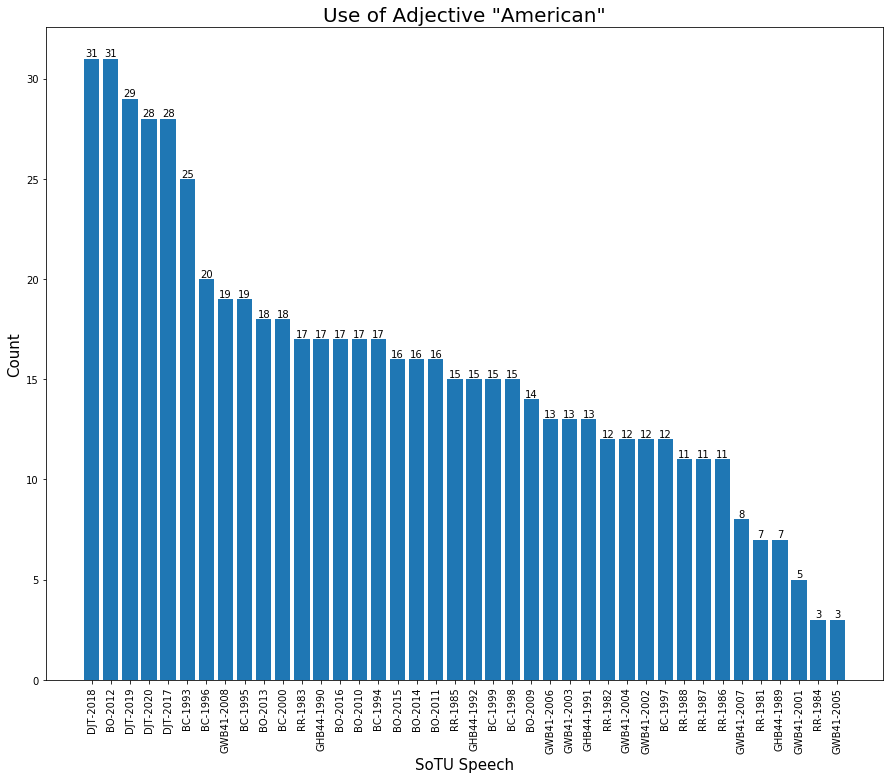

In [30]:
#Bar graph of the usage of word "American"

most_common_adj=[x[0] for x in count_adj.values()]
frequency=[x[1] for x in count_adj.values()]

frequency,df.index_=zip(*sorted(zip(frequency,df.index), reverse=True))

#_______________________________________________________________________________________________________
    
plt.figure(figsize=(15,12))

bar=plt.bar(df.index_,frequency)  
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%d' % int(height), ha='center', va='bottom')
plt.title('Use of Adjective "American"', fontsize=20)
plt.ylabel('Count',fontsize=15)
plt.xlabel('SoTU Speech',fontsize=15)
plt.xticks(rotation=90)

print("\n\nTakeaway:\n\n1.Interesting to note that \"American\" was the most frequent used adjective in each of Donald Trump's speeches. \n\n2.The most number of times \'American\' was used was 31 by Obama in 2012 and Trump in 2018.\n\n3. However, whereas Trump used the word \'American\' on an average of 29 times per speech, Obama only used it on an average of 18 times per speech during his 8 years of office."  )
plt.show()    

In [31]:
print('*'*125)

*****************************************************************************************************************************


**D4a. COMPARING LENGTH OF SPEECHES**
- republican vs. democrats
- longest speech vs. shortest speech

In [32]:
import datetime

def time(entry):
    h, m, s = entry.split(':')
    return datetime.timedelta(hours=int(h), minutes=int(m), seconds=int(s))

df["Length_of_Speech"] = df["Length_of_Speech"].apply(lambda x: time(x))

time=[df[df["Party_Affiliation"]=='Republican']['Length_of_Speech'].mean().seconds/60]
time.append(df[df["Party_Affiliation"]=='Democrat']['Length_of_Speech'].mean().seconds/60)


Takeaways:

1. Longest speech was delivered by Bill Clinton in 2000. 

2. Shortest speech was delivered by Ronald Reagon in 1986.

3. Other than Trump, democrats tend to give longer speeches than republicans. 

4. On average, speech by democrat presidents is ~15 minutes longer than speech by republican presidents (68 minutes to 51 minutes)


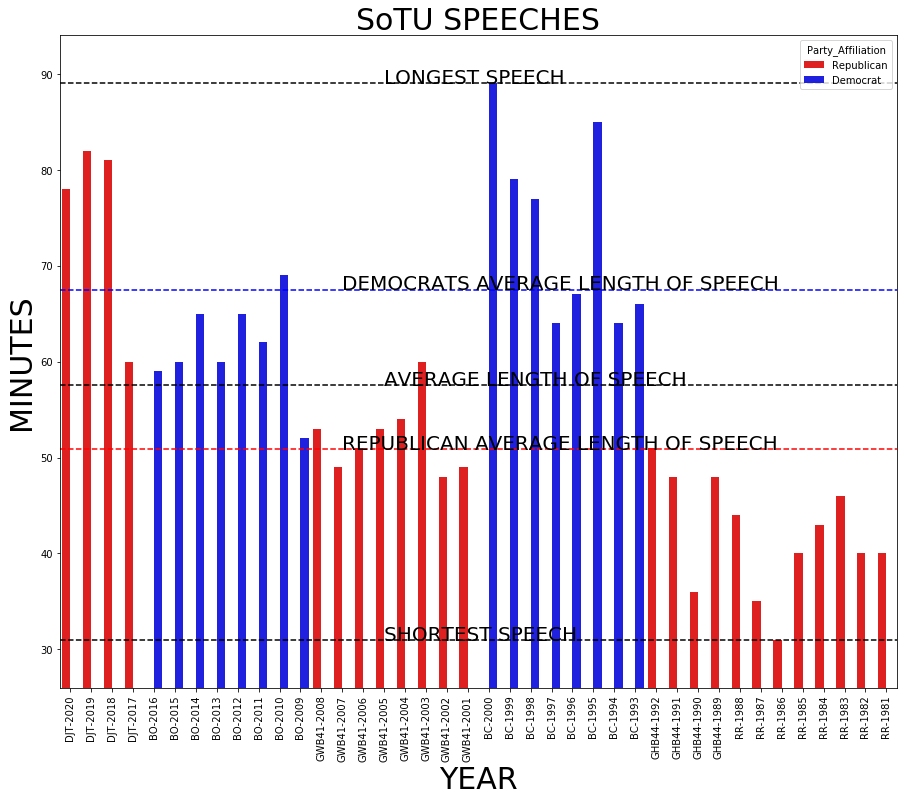

In [33]:
import seaborn as sns

minutes=[int(round(x.seconds/60,0)) for x in  df['Length_of_Speech']]
avg=np.array(minutes).mean()
min_=np.array(minutes).min()
max_=np.array(minutes).max()


plt.figure(figsize=(15,12))

colors = ["#FF0000", "#0000FF"]

s=sns.barplot(df.index,minutes,hue=df['Party_Affiliation'],palette=colors)

s.text(15,avg,'AVERAGE LENGTH OF SPEECH',fontsize=20)
s.axhline(y=avg, color='black',ls='--')

s.text(13,time[0],'REPUBLICAN AVERAGE LENGTH OF SPEECH',fontsize=20)
s.axhline(y=time[0], color='red',ls='--')

s.text(13,time[1],'DEMOCRATS AVERAGE LENGTH OF SPEECH',fontsize=20)
s.axhline(y=time[1], color='blue',ls='--')


s.text(15,min_,'SHORTEST SPEECH',fontsize=20)
s.axhline(y=min_, color='black',ls='--')

s.text(15,max_,'LONGEST SPEECH',fontsize=20)
s.axhline(y=max_, color='black',ls='--')



plt.xticks(rotation=90)
plt.ylim(min(minutes)-5,max(minutes)+5)
plt.xlabel("YEAR",fontsize=30)
plt.ylabel("MINUTES",fontsize=30)
plt.title("SoTU SPEECHES",fontsize=30)

print("\nTakeaways:\n\n1. Longest speech was delivered by Bill Clinton in 2000. \n\n2. Shortest speech was delivered by Ronald Reagon in 1986.\n\n3. Other than Trump, democrats tend to give longer speeches than republicans. \n\n4. On average, speech by democrat presidents is ~15 minutes longer than speech by republican presidents (68 minutes to 51 minutes)")
plt.show()

### E. TOPIC MODELING ###

- will try to uncover 2 topics to assess whether the topics diverge on partisan lines (republicans/democrats)

In [34]:
pd.set_option('display.max_columns',20000)

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS 

#vectorizer = TfidfVectorizer(max_df=.5, min_df=2, stop_words='english', use_idf=True, norm=u'l2', smooth_idf=True)

# Recreate document-term matrix
cv = CountVectorizer(stop_words=nlp.Defaults.stop_words)
cv = CountVectorizer(stop_words=ENGLISH_STOP_WORDS.union(stopwords_additions))

#sparse matrix(non-zeros)
sm = cv.fit_transform(df["Cleaned"])   



#sm=dtm
#cv.get_feature_names() = unique words
#cv.vocabulary_= indexing of unique words listed alphabetically


#Creating a DTM
dtm_df= pd.DataFrame(sm.toarray(), columns=cv.get_feature_names(), index=df.index)

#Transposing DTM to TDM
tdm=dtm_df.transpose()

C:\Users\admin\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:301: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['applauded', 'birthday', 'carolina', 'responded', 'sings', 'south'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [35]:
from gensim import matutils, models
import scipy.sparse

#Feeding TDM to SciPy to generate Sparse Matrix

sparse_counts = scipy.sparse.csr_matrix(tdm)   

sparse_counts  #shape of 3713 * 40 with 25764 non-zero fields

<3713x40 sparse matrix of type '<class 'numpy.int64'>'
	with 25764 stored elements in Compressed Sparse Row format>

In [36]:
#Feeding Sparse Matrix to Gensim corpus

corpus = matutils.Sparse2Corpus(sparse_counts)  #gensim corpus

In [37]:
#flipping key:value in the vocabulary to feed to the model

#cv.vocabulary_ = index of feature names ordered alphabetically

id2word={}
for k,v in cv.vocabulary_.items():
    id2word[v]=k


In [38]:
#Feed above info and the desired number of topics (2) and passes (iterations=1000) to the model

lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=2, passes=1000, random_state=45)
lda.print_topics()

[(0,
  '0.003*"kids" + 0.002*"industry" + 0.002*"oil" + 0.002*"wage" + 0.002*"race" + 0.002*"loans" + 0.002*"rules" + 0.002*"student" + 0.002*"ideas" + 0.002*"internet"'),
 (1,
  '0.003*"terror" + 0.003*"iraqi" + 0.002*"soviet" + 0.002*"border" + 0.002*"al" + 0.002*"qaida" + 0.002*"regime" + 0.002*"terrorist" + 0.002*"immigration" + 0.002*"vital"')]

In [39]:
#sorting the topics based on probability

topics_prob=[]
for topic in lda[corpus]:
    if len(topic) == 1:
        topics_prob.append(topic)
        #print(topic)
    elif len(topic) > 1:
        topic.sort(key = lambda x: x[1],reverse=True)
        #print(topic)
        topics_prob.append(topic) 
        
#topics_prob

In [40]:
#extracting topics

presidential_SoTU=[]   #extracting presidents and topic
for pres,topic in list(zip(df.index,topics_prob)):
    presidential_SoTU.append((pres,topic[0][0]))
    
topics=[x[1] for x in presidential_SoTU]   #extracting topic

df['Topic']=topics   #new series

#--------------------------------------------------

topic_mapping={0:'Domestic Issues',1:'Terrorism/Soviet Union'}

df['Topic']=df['Topic'].map(topic_mapping)  #map topics to verbiage



print('\n\nTakeaway: \n\nRepublican presidents tend to talk about foreign matters (Soviet Union/Terrorism) whereas democrat presidents tend to focus on domestic issues like race / kids and wages')

df[["Raw_SOTU_Transcripts",'Topic']] #df.



Takeaway: 

Republican presidents tend to talk about foreign matters (Soviet Union/Terrorism) whereas democrat presidents tend to focus on domestic issues like race / kids and wages


,Raw_SOTU_Transcripts,Topic
Init_Year,,
DJT-2020,"the president. thank you very much. thank you. thank you very much. madam speaker, mr. vice president, members of congress, the first lady of the united states, and my fellow citizens: three years...",Terrorism/Soviet Union
DJT-2019,"madam speaker, mr. vice president, members of congress, the first lady of the united states — (applause) — and my fellow americans: we meet tonight at a moment of unlimited potential. as we begin ...",Terrorism/Soviet Union
DJT-2018,"the president. mr. speaker, mr. vice president, members of congress, the first lady of the united states, and my fellow americans: less than 1 year has passed since i first stood at this podium, i...",Terrorism/Soviet Union
DJT-2017,"thank you very much. mr. speaker, mr. vice president, members of congress, the first lady of the united states, and citizens of america: tonight, as we mark the conclusion of our celebration of bl...",Terrorism/Soviet Union
BO-2016,"thank you. mr. speaker, mr. vice president, members of congress, my fellow americans: tonight marks the eighth year that i've come here to report on the state of the union. and for this final one,...",Domestic Issues
BO-2015,"the president. mr. speaker, mr. vice president, members of congress, my fellow americans: we are 15 years into this new century. fifteen years that dawned with terror touching our shores, that unf...",Domestic Issues
BO-2014,"the president. mr. speaker, mr. vice president, members of congress, my fellow americans: today in america, a teacher spent extra time with a student who needed it and did her part to lift america...",Domestic Issues
BO-2013,"please, everybody, have a seat. mr. speaker, mr. vice president, members of congress, fellow americans: fifty-one years ago, john f. kennedy declared to this chamber that ""the constitution makes u...",Domestic Issues
BO-2012,"mr. speaker, mr. vice president, members of congress, distinguished guests, and fellow americans: last month, i went to andrews air force base and welcomed home some of our last troops to serve in...",Domestic Issues


In [41]:
print("*"*125)

*****************************************************************************************************************************


### F. CLUSTER ANALYSIS ###

**F1. Vectorizing via TfidVectorizer**

In [42]:
#vectorizing the dataframe and then converting the Document Trim Matrix (DTM) into a Pandas df. After creating the df, add categorical features to the dataframe.


from sklearn.feature_extraction.text import TfidfVectorizer

vector = TfidfVectorizer(max_df=.5, min_df=2, stop_words=nlp.Defaults.stop_words, use_idf=True, norm=u'l2', smooth_idf=True)

sm_tfidf=vector.fit_transform(df['Cleaned'])

#Creating a DTM df
vector_df= pd.DataFrame(sm_tfidf.toarray(), columns=vector.get_feature_names(), index=df.index)


#Adding categorical features to the DTM through manual one-hot-encoding
vector_df['Party_Aff']=df["Party_Affiliation"].map({'Republican':1,'Democrat':0})
vector_df['PrePost911']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':0,'William J. Clinton':0,'George W. Bush':1,'Barack Obama':1,'Donald J. Trump':1})

vector_df['Pres_RR']=df['Presidents'].map({'Ronald Reagan':1,'George Bush':0,'William J. Clinton':0,'George W. Bush':0,'Barack Obama':0,'Donald J. Trump':0})
vector_df['Pres_GB']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':1,'William J. Clinton':0,'George W. Bush':0,'Barack Obama':0,'Donald J. Trump':0})
vector_df['Pres_BC']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':0,'William J. Clinton':1,'George W. Bush':0,'Barack Obama':0,'Donald J. Trump':0})
vector_df['Pres_GWB']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':0,'William J. Clinton':0,'George W. Bush':1,'Barack Obama':0,'Donald J. Trump':0})
vector_df['Pres_BO']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':0,'William J. Clinton':0,'George W. Bush':0,'Barack Obama':1,'Donald J. Trump':0})
vector_df['Pres_DJT']=df['Presidents'].map({'Ronald Reagan':0,'George Bush':0,'William J. Clinton':0,'George W. Bush':0,'Barack Obama':0,'Donald J. Trump':1})


#vector_df.head()

C:\Users\admin\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:301: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['applauded', 'birthday', 'carolina', 'll', 'responded', 'sings', 'south', 've'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [43]:
#Rearranging new columns by putting them in first

new_column=vector_df.pop('Party_Aff')
vector_df.insert(0,'Party_Aff',new_column)

new_column1=vector_df.pop('PrePost911')
vector_df.insert(1,'PrePost911',new_column1)

new_column2=vector_df.pop('Pres_RR')
vector_df.insert(2,'Pres_RR',new_column2)

new_column3=vector_df.pop('Pres_GB')
vector_df.insert(3,'Pres_GB',new_column3)

new_column4=vector_df.pop('Pres_BC')
vector_df.insert(4,'Pres_BC',new_column4)

new_column5=vector_df.pop('Pres_GWB')
vector_df.insert(5,'Pres_GWB',new_column5)

new_column6=vector_df.pop('Pres_BO')
vector_df.insert(6,'Pres_BO',new_column6)

new_column7=vector_df.pop('Pres_DJT')
vector_df.insert(7,'Pres_DJT',new_column7)

print(f'\n\nShape of the df is {vector_df.shape}.\n')

vector_df.head()



Shape of the df is (40, 3721).



Party_Aff  PrePost911  Pres_RR  Pres_GB  Pres_BC  Pres_GWB  \
Init_Year                                                               
DJT-2020           1           1        0        0        0         0   
DJT-2019           1           1        0        0        0         0   
DJT-2018           1           1        0        0        0         0   
DJT-2017           1           1        0        0        0         0   
BO-2016            0           1        0        0        0         0   

           Pres_BO  Pres_DJT   abandon  abandoned  abiding  abortion  \
Init_Year                                                              
DJT-2020         0         1  0.019421        0.0      0.0  0.023212   
DJT-2019         0         1  0.000000        0.0      0.0  0.026489   
DJT-2018         0         1  0.000000        0.0      0.0  0.000000   
DJT-2017         0         1  0.000000        0.0      0.0  0.000000   
BO-2016          1         0  0.000000        0.0      0.0  0.000000   

            abraham  absolute  absolutely    abuse  abuses  abusive   academy  \
Init_Year                                                                       
DJT-2020   0.022092  0.000000    0.022092  0.00000     0.0      0.0  0.055811   
DJT-2019   0.000000  0.029709    0.000000  0.00000     0.0      0.0  0.000000   
DJT-2018   0.000000  0.000000    0.026469  0.00000     0.0      0.0  0.000000   
DJT-2017   0.030825  0.000000    0.000000  0.00000     0.0      0.0  0.038937   
BO-2016    0.000000  0.000000    0.000000  0.04865     0.0      0.0  0.000000   

           accelerate   accept  acceptable  accepted  accident  accomplish  \
Init_Year                                                                    
DJT-2020     0.000000  0.00000    0.000000       0.0       0.0    0.000000   
DJT-2019     0.000000  0.00000    0.000000       0.0       0.0    0.000000   
DJT-2018     0.000000  0.00000    0.000000       0.0       0.0    0.000000   
DJT-2017     0.000000  0.00000    0.038937       0.0       0.0    0.032388   
BO-2016      0.060416  0.02189    0.000000       0.0       0.0    0.030208   

           accomplished  accomplishments  account  accountability  \
Init_Year                                                           
DJT-2020            0.0              0.0      0.0        0.000000   
DJT-2019            0.0              0.0      0.0        0.022163   
DJT-2018            0.0              0.0      0.0        0.046539   
DJT-2017            0.0              0.0      0.0        0.000000   
BO-2016             0.0              0.0      0.0        0.000000   

           accountable  accountants  accounts  achievable  achieved  \
Init_Year                                                             
DJT-2020      0.000000          0.0  0.000000         0.0  0.036040   
DJT-2019      0.000000          0.0  0.000000         0.0  0.000000   
DJT-2018      0.020846          0.0  0.017262         0.0  0.021591   
DJT-2017      0.000000          0.0  0.020103         0.0  0.000000   
BO-2016       0.000000          0.0  0.018750         0.0  0.000000   

           achievement  achievements  achieving  acid  acknowledge  acquire  \
Init_Year                                                                     
DJT-2020           0.0      0.000000   0.022092   0.0     0.000000      0.0   
DJT-2019           0.0      0.029709   0.000000   0.0     0.000000      0.0   
DJT-2018           0.0      0.000000   0.000000   0.0     0.000000      0.0   
DJT-2017           0.0      0.000000   0.000000   0.0     0.030825      0.0   
BO-2016            0.0      0.000000   0.000000   0.0     0.000000      0.0   

           acres  acrosstheboard     acted    acting   actions    active  \
Init_Year                                                                  
DJT-2020     0.0             0.0  0.000000  0.023212  0.000000  0.000000   
DJT-2019     0.0             0.0  0.019855  0.000000  0.000000  0.000000   
DJT-2018     0.0             0.0  0.000

**F2. Kmeans** clusters

In [44]:
from sklearn.cluster import KMeans

#2 clusters to see if there is the clusters split on party lines (republican and democrats)
kmeans=KMeans(n_clusters=2, random_state=44)

kmeans.fit(vector_df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [45]:
#adding new cluster column to a copy of the existing dataframe

vector_df_=vector_df.copy()

#new cluster column
vector_df_["k_means_clusters"]=kmeans.labels_

#reshifting new column
new_column=vector_df_.pop('k_means_clusters')
vector_df_.insert(0,'k_means_clusters',new_column)

#centroids
centroids=kmeans.cluster_centers_
print(f'\n\nThere are {len(centroids[0])} centroids.\n\n')

vector_df_.head()



There are 3721 centroids.




k_means_clusters  Party_Aff  PrePost911  Pres_RR  Pres_GB  Pres_BC  \
Init_Year                                                                       
DJT-2020                  1          1           1        0        0        0   
DJT-2019                  1          1           1        0        0        0   
DJT-2018                  1          1           1        0        0        0   
DJT-2017                  1          1           1        0        0        0   
BO-2016                   1          0           1        0        0        0   

           Pres_GWB  Pres_BO  Pres_DJT   abandon  abandoned  abiding  \
Init_Year                                                              
DJT-2020          0        0         1  0.019421        0.0      0.0   
DJT-2019          0        0         1  0.000000        0.0      0.0   
DJT-2018          0        0         1  0.000000        0.0      0.0   
DJT-2017          0        0         1  0.000000        0.0      0.0   
BO-2016           0        1         0  0.000000        0.0      0.0   

           abortion   abraham  absolute  absolutely    abuse  abuses  abusive  \
Init_Year                                                                       
DJT-2020   0.023212  0.022092  0.000000    0.022092  0.00000     0.0      0.0   
DJT-2019   0.026489  0.000000  0.029709    0.000000  0.00000     0.0      0.0   
DJT-2018   0.000000  0.000000  0.000000    0.026469  0.00000     0.0      0.0   
DJT-2017   0.000000  0.030825  0.000000    0.000000  0.00000     0.0      0.0   
BO-2016    0.000000  0.000000  0.000000    0.000000  0.04865     0.0      0.0   

            academy  accelerate   accept  acceptable  accepted  accident  \
Init_Year                                                                  
DJT-2020   0.055811    0.000000  0.00000    0.000000       0.0       0.0   
DJT-2019   0.000000    0.000000  0.00000    0.000000       0.0       0.0   
DJT-2018   0.000000    0.000000  0.00000    0.000000       0.0       0.0   
DJT-2017   0.038937    0.000000  0.00000    0.038937       0.0       0.0   
BO-2016    0.000000    0.060416  0.02189    0.000000       0.0       0.0   

           accomplish  accomplished  accomplishments  account  accountability  \
Init_Year                                                                       
DJT-2020     0.000000           0.0              0.0      0.0        0.000000   
DJT-2019     0.000000           0.0              0.0      0.0        0.022163   
DJT-2018     0.000000           0.0              0.0      0.0        0.046539   
DJT-2017     0.032388           0.0              0.0      0.0        0.000000   
BO-2016      0.030208           0.0              0.0      0.0        0.000000   

           accountable  accountants  accounts  achievable  achieved  \
Init_Year                                                             
DJT-2020      0.000000          0.0  0.000000         0.0  0.036040   
DJT-2019      0.000000          0.0  0.000000         0.0  0.000000   
DJT-2018      0.020846          0.0  0.017262         0.0  0.021591   
DJT-2017      0.000000          0.0  0.020103         0.0  0.000000   
BO-2016       0.000000          0.0  0.018750         0.0  0.000000   

           achievement  achievements  achieving  acid  acknowledge  acquire  \
Init_Year                                                                     
DJT-2020           0.0      0.000000   0.022092   0.0     0.000000      0.0   
DJT-2019           0.0      0.029709   0.000000   0.0     0.000000      0.0   
DJT-2018           0.0      0.000000   0.000000   0.0     0.000000      0.0   
DJT-2017           0.0      0.000000   0.000000   0.0     0.030825      0.0   
BO-2016            0.0      0.000000   0.000000   0.0     0.000000      0.0   

           acres  acrosstheboard     acted    acting   actions    active  \
Init_Year                                                                  
DJT-2020     0.0             0.0  0.000000  0.023212  0.000000  0

**F3. PLOTTING OF CLUSTERS**

Takeaway:

Interesting to see that the 2 clusters are NOT split on party affiliation (as anticipated in line 45) bur rather split on when the speech was delivered Pre/Post 911.




<Figure size 2880x1152 with 0 Axes>

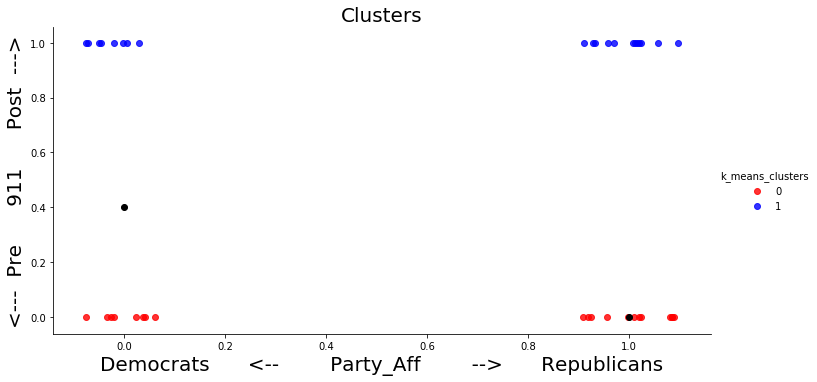

In [46]:
#Plotting Party_affiliation and Pre/Post 911 color-coded by cluster analysis
plt.figure(figsize=(40,16))
sns.lmplot("Party_Aff","PrePost911",data=vector_df_,fit_reg=False,hue="k_means_clusters",height=5,aspect=2,x_jitter=.1,palette=["#FF0000", "#0000FF"])
plt.scatter(centroids[:,1],centroids[:,2],color="k")
plt.xlabel("Democrats      <--        Party_Aff        -->      Republicans",fontsize=20)
plt.ylabel("<---  Pre      911      Post  --->",fontsize=20)
plt.title("Clusters",fontsize=20)

print("Takeaway:\n\nInteresting to see that the 2 clusters are NOT split on party affiliation (as anticipated in line 45) bur rather split on when the speech was delivered Pre/Post 911.\n\n")
plt.show()

In [47]:
print("*"*126)

******************************************************************************************************************************


**F4. CLUSTER ANALYSIS**

In [48]:
#mean of tfidf scores of words grouped by clusters

Cluster_analysis_df=vector_df_.groupby(["k_means_clusters"]).mean()
#Cluster_analysis_df

In [49]:
#transpose the grouped by cluster analysis df above and rename clusters/columns to "Pre911" and "Post911" based on the plot above (911 served as the delienating point between the two clusters )

Cluster_analysis_df_t=Cluster_analysis_df.rename({0:"Pre-911",1:"Post-911"}).transpose()['abandon':]
#Cluster_analysis_df_t

In [50]:
#Words with the most weight pre and post 911

Most_important_word_Pre911=Cluster_analysis_df_t.sort_values('Pre-911',ascending=False)['Pre-911'].head(1)
Most_important_word_Post911=Cluster_analysis_df_t.sort_values('Post-911',ascending=False)['Post-911'].head(1)

print(f'Interesting observation: \n\nBetween 1980 and 2001 (Pre911), \'{Most_important_word_Pre911.index[0]}\' was the most emphasized topic/word in speeches that it was mentioned in /referred to. \n\nPost 911, the most emphasized topic in relation to the respective speech became \'{Most_important_word_Post911.index[0]}\'.')

Interesting observation: 

Between 1980 and 2001 (Pre911), 'soviet' was the most emphasized topic/word in speeches that it was mentioned in /referred to. 

Post 911, the most emphasized topic in relation to the respective speech became 'iraqi'.


In [51]:
print("*"*125)

*****************************************************************************************************************************


**F5. REPUBLICAN / DEMOCRATS ANALYSIS**

In [52]:
#mean of tfidf scores of words grouped by party affiliation

Party_aff_analysis_df=vector_df_.groupby(["Party_Aff"]).mean()
#Party_aff_analysis_df

In [53]:
#transpose the grouped by df above and rename columns to "Democrat" and "Republican")

Party_aff_analysis_df_t=Party_aff_analysis_df.rename({0:"Democrat",1:"Republican"}).transpose()['abandon':]
#Party_aff_analysis_df_t

In [54]:
#Words with the most weight for democrats and republicans

Most_important_word_Democrat=Party_aff_analysis_df_t.sort_values('Democrat',ascending=False)['Democrat'].head(1)
Most_important_word_Republican=Party_aff_analysis_df_t.sort_values('Republican',ascending=False)['Republican'].head(1)

print(f'Interesting observation: \n\nDemocrats usually make \'{Most_important_word_Democrat.index[0]}\' the theme of their speeches whereas republicans usually talk about \'{Most_important_word_Republican.index[0]}\'.')

Interesting observation: 

Democrats usually make 'kids' the theme of their speeches whereas republicans usually talk about 'terror'.


In [55]:
print("*"*126)

******************************************************************************************************************************


**F6. Themes Specific to Each President**

In [56]:
presidents=vector_df_[['Pres_RR','Pres_GB','Pres_BC','Pres_GWB','Pres_BO','Pres_DJT']].columns

Presidential_theme={}
for president in presidents:
    df=vector_df_.groupby([president]).mean()  #mean score of the most emphasized word of all the years served under the president
    df_t=df.rename({0:"Others",1:president}).transpose()['abandon':]
    MIW=df_t[president].idxmax()
    Presidential_theme[president]=MIW  #MIW=most important word
    
Presidential_theme

{'Pres_RR': 'soviet',
 'Pres_GB': 'soviet',
 'Pres_BC': 'gun',
 'Pres_GWB': 'iraqi',
 'Pres_BO': 'kids',
 'Pres_DJT': 'border'}

**Conclusion**
- As expected, **the 80's** mainly dealt with the **Soviet Union**. 
- **The 90's**, though not as clear cut, did focus on **stopping gun violence**. The Brady Handgun Violence Prevention Act was enacted in the 90's. Other gun controls were also put in place soon after the Columbine school shooting.
- The **2000's** revolved around the **Iraq War**.
- The **late 2000's and the first half of this decade** dealt with the economy rebounding from the financial crisis of 2008. In that context, **'kids' were referred to many times to emphasize the difficulty of parents working and taking care of their children**. Different economic policies were referred to in speeches to ensure 'kids' go to college. In addition, "kids" were also referred to within the context of tackling childhood obesity led by Michelle Obama.
- **Late 2010's** focused on illegal immigration and **US/Mexico border**.